# 图片剪裁
检测出手之后，下一阶段就是根据手的位置裁剪出一块区域，检测该区域内的物体，然后判断交互的概率。

## 手的位置
在模型预测手位置的时候，会生成一个txt文件，包含x, y, w, h。通过`--save-txt`指定写入。

In [1]:
import shutil
shutil.copyfile('./assets/my_hand.JPG', './yolov3/data/samples/my_hand_det.jpg')
%cd yolov3/
# detect hands
!python detect.py --cfg 'cfg/yolov3-hands.cfg' --weights 'weights/best-scrach-100.pt' --names 'data/hands.names' --img-size 416 --save-txt

/Users/aaron/Desktop/code/dissertation-diary/yolov3
Namespace(agnostic_nms=False, augment=False, cfg='cfg/yolov3-hands.cfg', classes=None, conf_thres=0.3, device='', fourcc='mp4v', half=False, img_size=416, iou_thres=0.6, names='data/hands.names', output='output', save_txt=True, source='data/samples', view_img=False, weights='weights/best-scrach-100.pt')
Using CPU

Model Summary: 222 layers, 6.15237e+07 parameters, 6.15237e+07 gradients
image 1/1 data/samples/my_hand_det.jpg: 352x416 1 hands, Done. (0.934s)
Results saved to /Users/aaron/Desktop/code/dissertation-diary/yolov3/output
Done. (1.590s)


[[0.394841, 0.644015, 0.131448, 0.220569]]


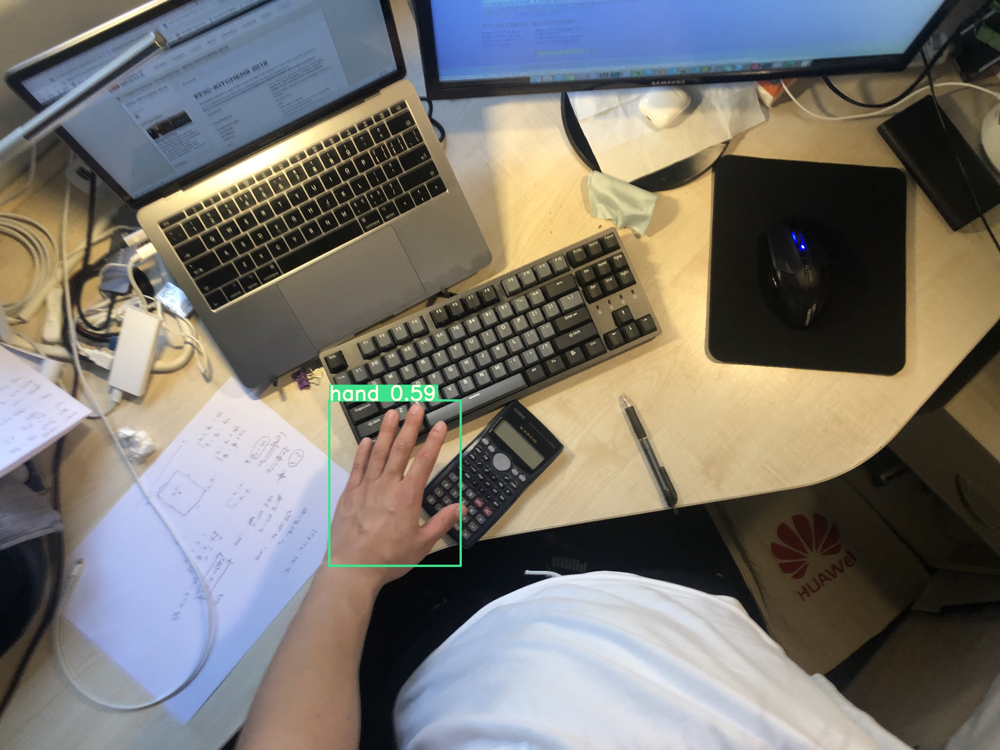

In [2]:
with open('./output/my_hand_det.txt') as f:
    boxes = f.readlines()

# 提取每个边框的信息
boxes_info = []
for box in boxes:
    box_info = box.strip().split(' ')[1:]
    box_info = [float(x) for x in box_info]
    boxes_info.append(box_info)
print(boxes_info)

from IPython.display import Image
Image('./output/my_hand_det.jpg')

## 裁切图片，检测物体

img_h, img_w:  (3024, 4032)
[[1591, 1947, 529, 667]]
[[1591, 1947]]


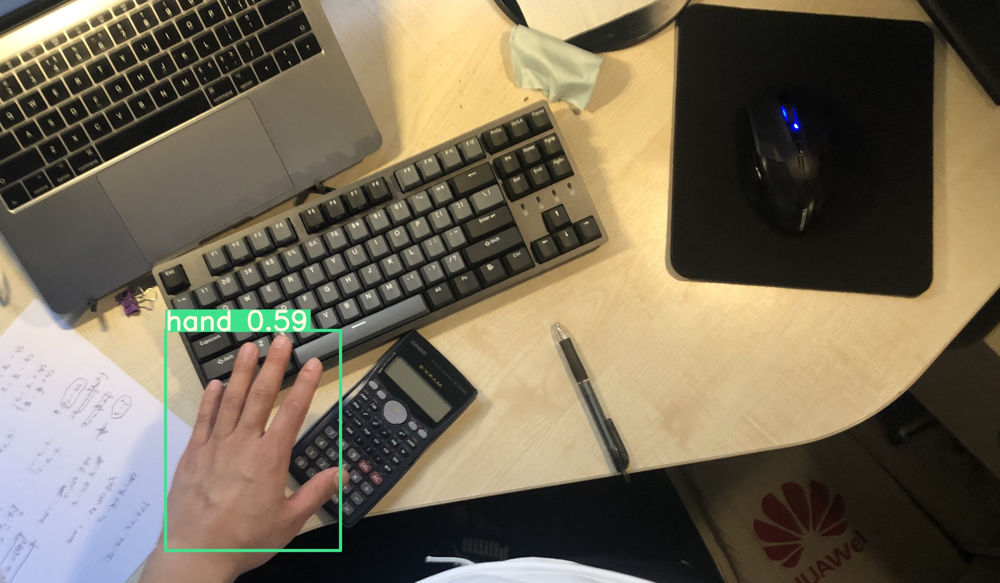

In [4]:
import cv2
img = cv2.imread('./output/my_hand_det.jpg')
img_size = img.shape
img_h, img_w, _ = img_size
print('img_h, img_w: ', (img_h, img_w))

# sample a pitch of origin image
def crop_img(img, box):
    h, w, _ = img.shape
    x_start = int(box[0] - box[2] / 2 ) - 500
    x_end = int(box[0] + box[2] / 2 ) + 2000
    y_start = int(box[1] - box[3] / 2 ) - 1000
    y_end = int(box[1] + box[3] /2 ) + 100
    cropImg = img[y_start:y_end, x_start:x_end]
    cv2.imwrite('./cropped_myhand.jpg', cropImg)

# rescale bounding boxes w.r.t image size
unnorm_box_info = []
hands_loc = []
for box_info in boxes_info:
    x_c = box_info[0] * img_w
    y_c = box_info[1] * img_h
    w = box_info[2] * img_w
    h = box_info[3] * img_h
    
    unnorm_box_info.append([int(x) for x in [x_c, y_c, w, h]])
    hands_loc.append([int(x) for x in [x_c, y_c]])
print(unnorm_box_info)
print(hands_loc)

crop_img(img, unnorm_box_info[0])
Image('./cropped_myhand.jpg')

In [14]:
# download yolov3
#!git clone https://github.com/SuyueLiu/yolov3.git

fatal: destination path 'yolov3' already exists and is not an empty directory.


In [5]:
# detecting objects with pre-trained model
!python detect.py --save-txt

Namespace(agnostic_nms=False, augment=False, cfg='cfg/yolov3-spp.cfg', classes=None, conf_thres=0.3, device='', fourcc='mp4v', half=False, img_size=512, iou_thres=0.6, names='data/coco.names', output='output', save_txt=True, source='data/samples', view_img=False, weights='weights/yolov3-spp-ultralytics.pt')
Using CPU

Model Summary: 225 layers, 6.29987e+07 parameters, 6.29987e+07 gradients
image 1/1 data/samples/my_hand_det.jpg: 384x512 1 persons, 1 tvs, 1 laptops, 1 mouses, 1 keyboards, 1 cell phones, Done. (1.186s)
Results saved to /Users/aaron/Desktop/code/dissertation-diary/yolov3/output
Done. (1.741s)


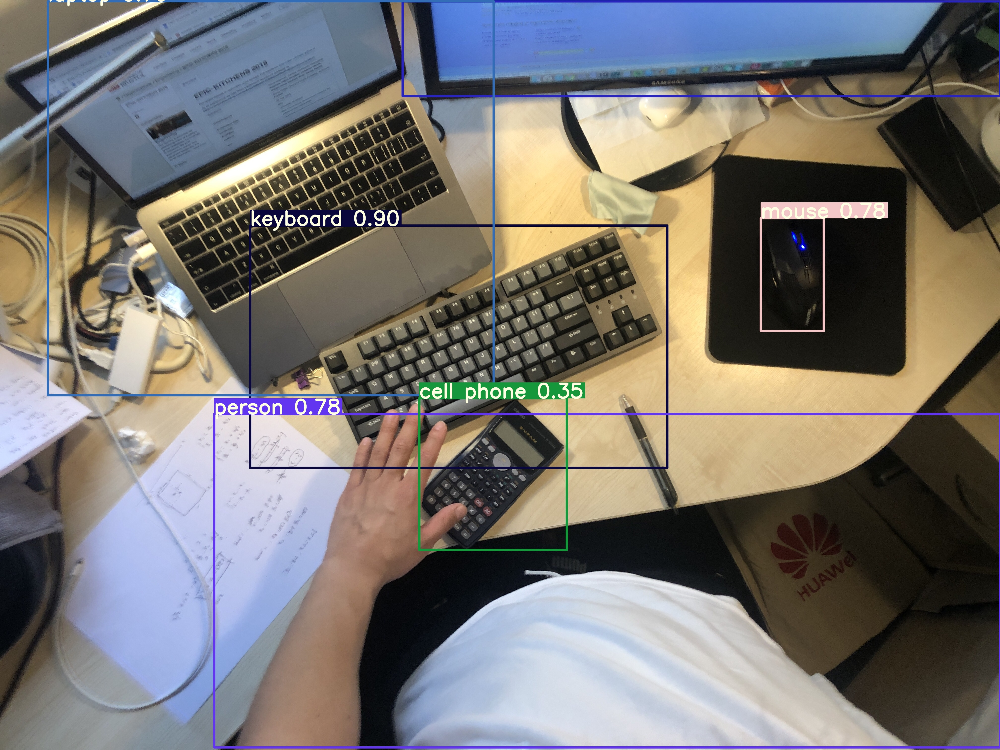

In [10]:
Image('./output/my_hand_det.jpg')

In [6]:
with open('./output/my_hand_det.txt') as f:
    contents = f.readlines()

objects = []
for content in contents:
    content = content.strip().split(' ')
    content = [float(x) for x in content]
    if content[0] != 0:
        objects.append(content)
print(objects)

[[66.0, 0.458581, 0.462136, 0.417163, 0.323082], [62.0, 0.701265, 0.0648148, 0.59747, 0.126323], [63.0, 0.270709, 0.264054, 0.445685, 0.525463], [64.0, 0.792163, 0.365906, 0.062996, 0.150463], [67.0, 0.492932, 0.631944, 0.147569, 0.202381]]


In [7]:
# 在指定位置写上物体的名字和交互概率
import numpy as np
with open('./data/coco.names') as f:
    names = f.readlines()
names = [name.strip() for name in names]
print(names)

# 计算两个物体中心点之间的距离
def cal_distance(point1, point2):
    x1, y1 = point1[0], point1[1]
    x2, y2 = point2[0], point2[1]
    distance = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)

    return distance

['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


## 打印信息

In [9]:
from random import randint

distances = []
for obj in objects:
    obj_x_c, obj_y_c = obj[1:3]
    obj_x_c = int(obj_x_c * img_w)
    obj_y_c = int(obj_y_c * img_h)
    obj_loc = (obj_x_c, obj_y_c)
    color = (randint(0, 256), randint(0, 256),randint(0, 256))
    d = cal_distance([obj_x_c, obj_y_c], [hands_loc[0][0], hands_loc[0][1]])
    distances.append(d)
    cv2.line(img, obj_loc, (hands_loc[0][0], hands_loc[0][1]), color, 10)
    cv2.circle(img, obj_loc, 10, (255, 255, 255), 8)

probs = [(np.sum(distances) - d)/np.sum(distances) for d in distances]
for i in range(len(objects)):
    text =names[int(objects[i][0])]  + ' ' + format(probs[i], '.2f')
    place = (int(objects[i][1] * img_w), int(objects[i][2] * img_h))
    font_color = (randint(0, 256), randint(0, 256),randint(0, 256))
    cv2.putText(img, text, place, cv2.FONT_HERSHEY_SIMPLEX, 3, font_color, 8)
    cv2.imwrite('../result.jpg', img)

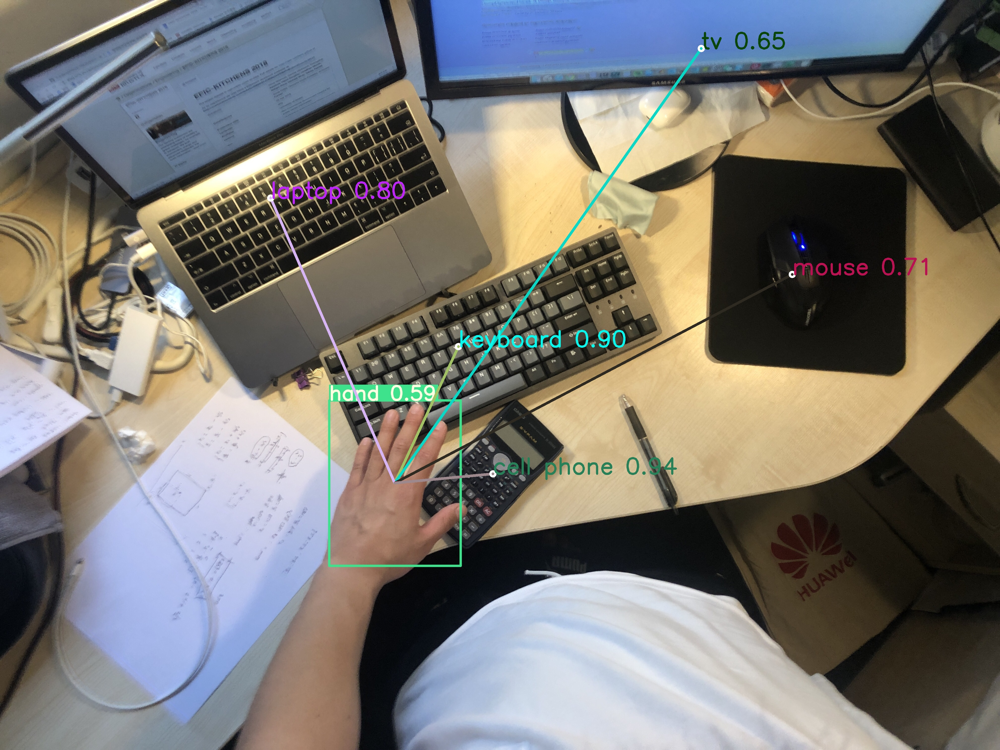

In [10]:
Image('../result.jpg')

## 结果
上图所示的概率是基于手和物体中心点之间的距离来计算的，算是一个最简单直接的方法吧，但是我觉得有很多不合理的地方：
* 结果并不是基于大量的数据产生的，不具备代表性和说服力；
* 我认为大概率情况下人会用自己的右手去触碰自己所处环境右侧的物体，同样的用左手去触碰左侧区域的物体。所以途中的左手去触碰右侧的鼠标和屏幕的概率应该远小于其余的情况，但是现在的结果且不是这样的；

**后续的思路：**
* 通过human-object interaction 领域的算法看看能不能有灵感；
* 如果直接用action recognition的网络，那还用目标识别的网络干嘛呢，直接就可以识别出物体和动作；
* 看看有没有用CNN实现该目标的可能，如果可以的话那就可以把yolo的部分网络进行复用，一边做目标检测，一边做动作识别。